
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [ ]:
#یکسری بخش هارو کامنت کردم تا فقط در کدم یک بار ران بشه هی ران نشه  

This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [2]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 57.2 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')

np.__version__,

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4',)

## Loading the Data

In [ ]:
# import zipfile

# # Path to the zip file
# zip_path = '/content/drive/MyDrive/drive-download-20241212T153946Z-001.zip'

# # Path to the directory where the contents will be extracted
# extract_path = '/content/drive/MyDrive/'

# # Ensure the extraction path exists
# if not os.path.exists(extract_path):
#     os.makedirs(extract_path)

# # Unzip the file
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_path)

# print("Unzipping complete!")


In [4]:

def load_data(PATH):
    # Initialize lists to store filenames and their corresponding labels
    filenames = []
    labels = []

    # Walk through the directory structure to get filenames and labels
    for folder_name in os.listdir(PATH):
        folder_path = os.path.join(PATH, folder_name)

        # Check if it is a directory (bird species)
        if os.path.isdir(folder_path):
            label = folder_name  # The folder name is the bird species label
            for image_name in os.listdir(folder_path):
                image_path = os.path.join(folder_path, image_name)
                filenames.append(image_path)
                labels.append(label)

    # Create a DataFrame from the filenames and labels
    data = pd.DataFrame({'filename': filenames, 'label': labels})

    # Shuffle the DataFrame (randomize order)
    data = data.sample(frac=1).reset_index(drop=True)

    return data

# Load the training, validation, and test data using the load_data function
train_data = load_data('/content/drive/MyDrive/train')
valid_data = load_data('/content/drive/MyDrive/valid')
test_data = load_data('/content/drive/MyDrive/test')

# Check the shape of the loaded DataFrames to verify correct data loading
print(f"Training data shape: {train_data.shape}")
print(f"Validation data shape: {valid_data.shape}")
print(f"Test data shape: {test_data.shape}")

Training data shape: (3208, 2)
Validation data shape: (100, 2)
Test data shape: (100, 2)


In [5]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_data = pd.concat([train_data, test_data], ignore_index=True)

# Check the shape of the combined DataFrame to verify
print(f"Combined data shape: {combined_data.shape}")


Combined data shape: (3308, 2)


Displaying the first 5 rows of the DataFrame:


,filename,label
0,/content/drive/MyDrive/train/ALTAMIRA YELLOWTHROAT/034.jpg,ALTAMIRA YELLOWTHROAT
1,/content/drive/MyDrive/train/AFRICAN EMERALD CUCKOO/095.jpg,AFRICAN EMERALD CUCKOO
2,/content/drive/MyDrive/train/ALBATROSS/101.jpg,ALBATROSS
3,/content/drive/MyDrive/train/AFRICAN PIED HORNBILL/089.jpg,AFRICAN PIED HORNBILL
4,/content/drive/MyDrive/train/ABBOTTS BOOBY/146.jpg,ABBOTTS BOOBY


Checking for missing values in the DataFrame:
filename    0
label       0
dtype: int64
Visualizing the distribution of labels:


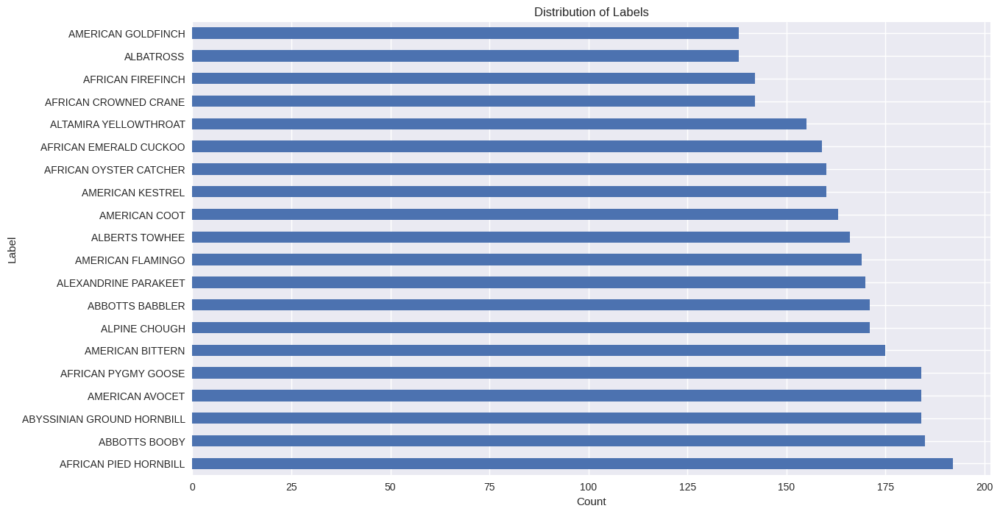

Displaying the unique labels in the DataFrame:
Unique labels: ['ALTAMIRA YELLOWTHROAT' 'AFRICAN EMERALD CUCKOO' 'ALBATROSS'
 'AFRICAN PIED HORNBILL' 'ABBOTTS BOOBY' 'ALEXANDRINE PARAKEET'
 'ABYSSINIAN GROUND HORNBILL' 'AFRICAN FIREFINCH' 'AMERICAN FLAMINGO'
 'AFRICAN CROWNED CRANE' 'AMERICAN GOLDFINCH' 'AFRICAN OYSTER CATCHER'
 'AMERICAN COOT' 'ABBOTTS BABBLER' 'ALBERTS TOWHEE' 'AFRICAN PYGMY GOOSE'
 'AMERICAN KESTREL' 'ALPINE CHOUGH' 'AMERICAN BITTERN' 'AMERICAN AVOCET']
Displaying summary statistics of the DataFrame:
                                                 filename  \
count                                                3308   
unique                                               3308   
top     /content/drive/MyDrive/test/AMERICAN FLAMINGO/...   
freq                                                    1   

                        label  
count                    3308  
unique                     20  
top     AFRICAN PIED HORNBILL  
freq                      192  


In [6]:
# Explore the new DataFrame

from IPython.display import display, HTML

# Display the first few rows of the combined DataFrame as a pretty table
def display_pretty_table(df, n=5):
    print(f"Displaying the first {n} rows of the DataFrame:")
    display(HTML(df.head(n).to_html()))

# Check the first few rows of the combined DataFrame
display_pretty_table(combined_data)

# Check for missing values
print("Checking for missing values in the DataFrame:")
print(combined_data.isnull().sum())

# Visualize the distribution of labels
print("Visualizing the distribution of labels:")
plt.figure(figsize=(14, 8))
combined_data['label'].value_counts().plot(kind='barh')
plt.title('Distribution of Labels')
plt.xlabel('Count')
plt.ylabel('Label')
plt.show()

# Display the unique labels
print("Displaying the unique labels in the DataFrame:")
print(f"Unique labels: {combined_data['label'].unique()}")

# Summary statistics of the DataFrame
print("Displaying summary statistics of the DataFrame:")
print(combined_data.describe())


## Plot some of the images

Plotting a grid of images from the combined dataset:


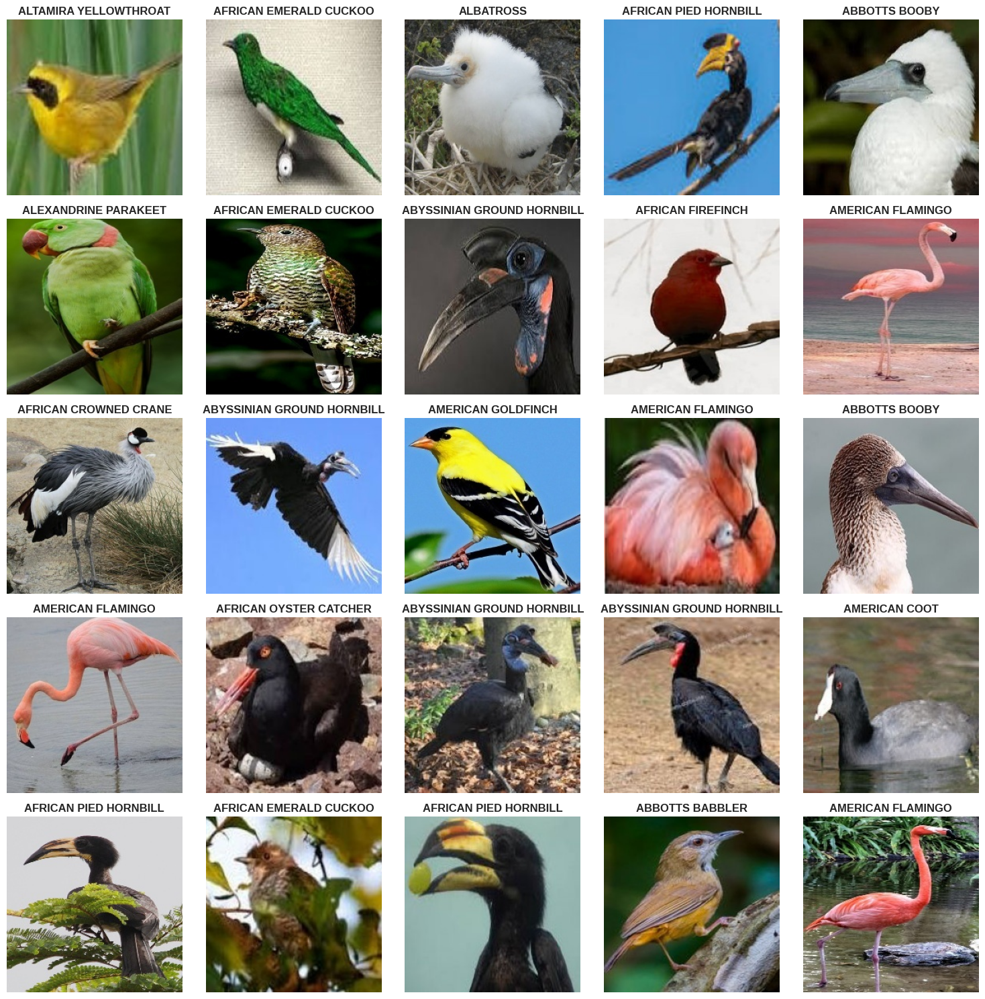

In [7]:
# TODO: Plot some of images

def plot_images_grid(data, rows=5, cols=5):
    """
    Plot a grid of images from the dataset.

    Args:
        data (DataFrame): The DataFrame containing image file paths and labels.
        rows (int): The number of rows in the grid.
        cols (int): The number of columns in the grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    for i in range(rows * cols):
        img_path = data['filename'].iloc[i]
        label = data['label'].iloc[i]
        img = plt.imread(img_path)

        ax = axes[i // cols, i % cols]
        ax.imshow(img)
        ax.set_title(label, fontsize=12, fontweight='bold')  # Make labels larger and bold
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Plot a grid of images from the combined dataset
print("Plotting a grid of images from the combined dataset:")
plot_images_grid(combined_data, rows=5, cols=5)


## Dataset Distribution
plot the distribution of the dataset, both training and validation set

Plotting the distribution of classes for training and validation data:


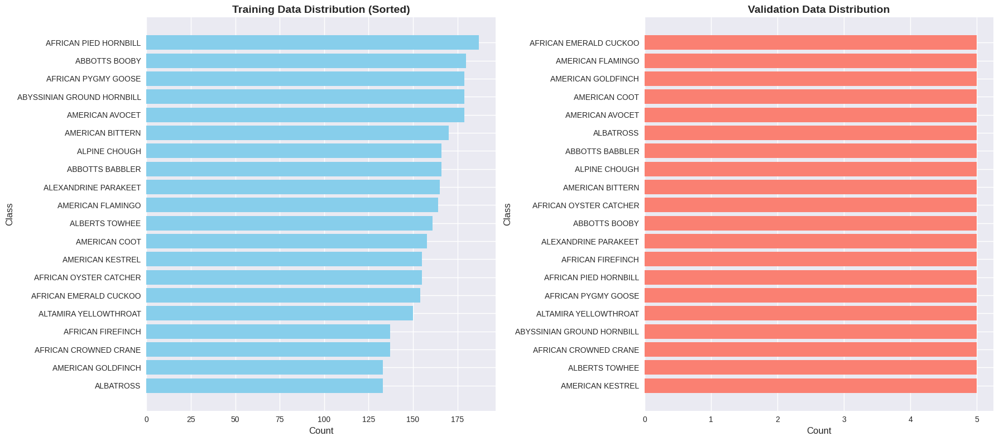

Displaying the label mapping table (sorted by frequency):


Label,Encoded Label,Count
ALBATROSS,0,133
AMERICAN GOLDFINCH,1,133
AFRICAN CROWNED CRANE,2,137
AFRICAN FIREFINCH,3,137
ALTAMIRA YELLOWTHROAT,4,150
AFRICAN EMERALD CUCKOO,5,154
AFRICAN OYSTER CATCHER,6,155
AMERICAN KESTREL,7,155
AMERICAN COOT,8,158
ALBERTS TOWHEE,9,161


Plotting the distribution of encoded classes for training and validation data:


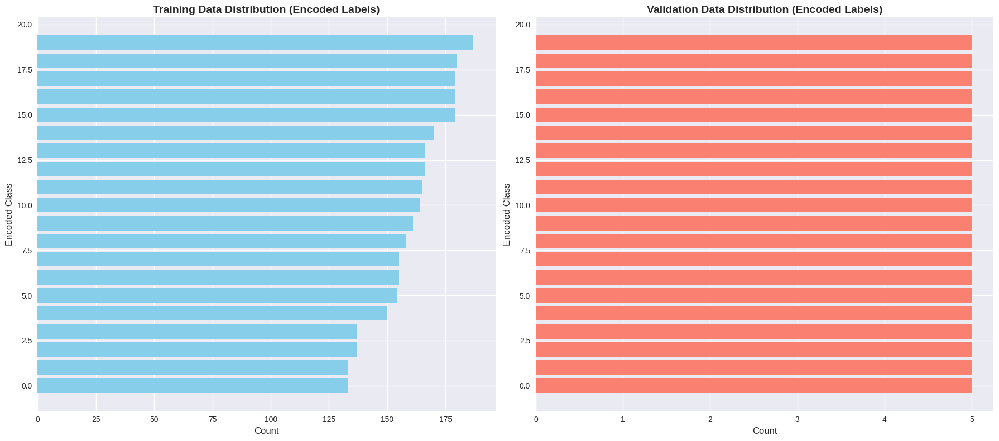

In [8]:
# Plot the distribution of classes for training and validation data

def plot_class_distribution(train_data, valid_data):
    """
    Plot the distribution of classes for training and validation data.

    Args:
        train_data (DataFrame): The training data DataFrame.
        valid_data (DataFrame): The validation data DataFrame.
    """
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Sort labels by their frequency in ascending order
    train_label_order = train_data['label'].value_counts().sort_values().index

    # Plot training data distribution
    axes[0].barh(train_label_order, train_data['label'].value_counts().sort_values().values, color='skyblue')
    axes[0].set_title('Training Data Distribution (Sorted)', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Count', fontsize=12)
    axes[0].set_ylabel('Class', fontsize=12)

    # Plot validation data distribution
    axes[1].barh(valid_data['label'].value_counts().index, valid_data['label'].value_counts().values, color='salmon')
    axes[1].set_title('Validation Data Distribution', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Count', fontsize=12)
    axes[1].set_ylabel('Class', fontsize=12)

    plt.tight_layout()
    plt.show()

# Plot the class distribution for training and validation data
print("Plotting the distribution of classes for training and validation data:")
plot_class_distribution(train_data, valid_data)

# Encode the labels as numbers based on the distribution from low to high
label_order = train_data['label'].value_counts().sort_values().index
label_mapping = {label: idx for idx, label in enumerate(label_order)}

# Map the labels to the new encoded values
train_data['encoded_label'] = train_data['label'].map(label_mapping)
valid_data['encoded_label'] = valid_data['label'].map(label_mapping)
test_data['encoded_label'] = test_data['label'].map(label_mapping)
combined_data['encoded_label'] = combined_data['label'].map(label_mapping)


# Create a table with label names, counts, and their encoded values
label_table = pd.DataFrame({'Label': label_order, 'Encoded Label': range(len(label_order)), 'Count': train_data['label'].value_counts().sort_values().values})
print("Displaying the label mapping table (sorted by frequency):")
display(HTML(label_table.to_html(index=False)))

# Plot the distribution of encoded labels for training and validation data
def plot_encoded_class_distribution(train_data, valid_data):
    """
    Plot the distribution of encoded labels for training and validation data.

    Args:
        train_data (DataFrame): The training data DataFrame.
        valid_data (DataFrame): The validation data DataFrame.
    """
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Plot training data distribution
    counts = train_data['encoded_label'].value_counts().sort_index()
    bars = axes[0].barh(counts.index, counts.values, color='skyblue')
    axes[0].set_title('Training Data Distribution (Encoded Labels)', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Count', fontsize=12)
    axes[0].set_ylabel('Encoded Class', fontsize=12)

    # Plot validation data distribution
    counts = valid_data['encoded_label'].value_counts().sort_index()
    bars = axes[1].barh(counts.index, counts.values, color='salmon')
    axes[1].set_title('Validation Data Distribution (Encoded Labels)', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Count', fontsize=12)
    axes[1].set_ylabel('Encoded Class', fontsize=12)

    plt.tight_layout()
    plt.show()

# Plot the encoded class distribution for training and validation data
print("Plotting the distribution of encoded classes for training and validation data:")
plot_encoded_class_distribution(train_data, valid_data)


## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


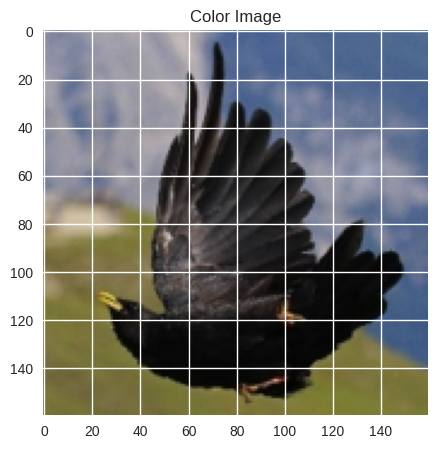

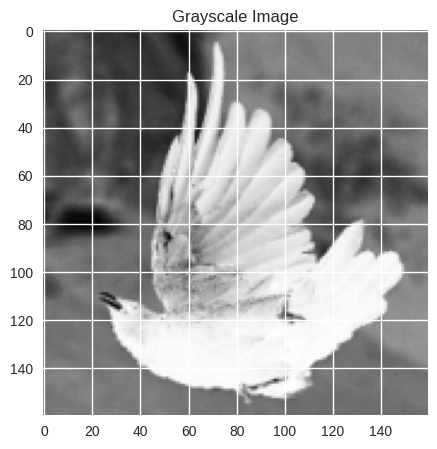

In [9]:
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image, ImageEnhance, ImageOps
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt

class InvertColors:
    def __call__(self, img):
        return ImageOps.invert(img)

# Dataset Class
class BirdDataset(Dataset):
    def __init__(self, df, transform_color=None):
        self.df = df
        # self.transform_gray = transform_gray
        self.transform_color = transform_color

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.iloc[idx]['filename']
        image = Image.open(img_path).convert('RGB')  # Load the image as RGB

        # Apply transforms
        color_image = self.transform_color(image) if self.transform_color else image
        #grayscale_image = self.transform_gray(image) if self.transform_gray else image
        to_pil = transforms.ToPILImage()
        pil_image = to_pil(color_image)
        transform_gray = transforms.Compose([
                                            InvertColors(),
                                            transforms.Grayscale(num_output_channels=1),
                                            transforms.ToTensor(),
                                            ])
        grayscale_image = transform_gray(pil_image)

        return grayscale_image, color_image

final_transform_color = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    #transforms.Normalize(mean=mean_color.tolist(), std=std_color.tolist()),
])

# Load Test Data
test_dataset = BirdDataset(test_data, transform_color=final_transform_color)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True, num_workers=4)

# Updated Dataset with Normalization
train_dataset = BirdDataset(train_data,  transform_color=final_transform_color)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
valid_dataset = BirdDataset(valid_data,  transform_color=final_transform_color)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=True, num_workers=4)

# Display a Batch of Unnormalized Images
data_iter = iter(train_loader)
grayscale_images, color_images = next(data_iter)

grayscale_image = grayscale_images[0]
color_image = color_images[0]

# Plot Color Image
plt.figure(figsize=(5, 5))
plt.imshow(color_image.permute(1, 2, 0).numpy())  # Convert CHW to HWC
plt.title("Color Image")
plt.show()

# Plot Grayscale Image
plt.figure(figsize=(5, 5))
plt.imshow(grayscale_image.permute(1,2,0).numpy(), cmap='gray')
plt.title("Grayscale Image")
plt.show()

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**


Data augmentation is crucial for training image models because it helps the model generalize better by exposing it to variations in the training data. It increases dataset diversity, making the model more robust and capable of handling different real-world scenarios.

Beneficial techniques for this assignment include:
- **Random Resized Crop**: Randomly cropping the images to (160, 160).
- **Random Horizontal Flip**: Flipping images horizontally.
- **Color Jitter**: Adjusting brightness, contrast, saturation, and hue.
- **Rotation**: Slightly rotating images.
- **Normalization**: Standardizing the pixel values.

These techniques improve model performance and prevent overfitting.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from tqdm import tqdm
from ranger21 import Ranger21  # Make sure to install `ranger21` package
from torch.optim.lr_scheduler import CosineAnnealingLR

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Encoder definition
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.enc1 = self.conv_block(1, 64)    # Grayscale input
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
           # nn.AvgPool2d(kernel_size=2, stride=2)  # Downsample
        )

    def forward(self, x):
        x1 = self.enc1(x)  # 160x160 -> 80x80
        x2 = self.enc2(x1)  # 80x80 -> 40x40
        x3 = self.enc3(x2)  # 40x40 -> 20x20
        x4 = self.enc4(x3)  # 20x20 -> 10x10
        return x1, x2, x3, x4

# Decoder definition
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.dec4 = self.upconv_block(512, 256)  # 10x10 -> 20x20
        self.dec3 = self.upconv_block(256, 128)  # 20x20 -> 40x40
        self.dec2 = self.upconv_block(128, 64)   # 40x40 -> 80x80
        self.dec1 = self.final_block(64, 3)      # 80x80 -> 160x160 (RGB output)

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def final_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()  # Scale output to [0, 1]
        )

    def forward(self, x1, x2, x3, x4):
        x = self.dec4(x4) + x3  # Skip connection
        x = self.dec3(x) + x2   # Skip connection
        x = self.dec2(x) + x1   # Skip connection
        x = self.dec1(x)        # Final output
        return x

# Full Colorization Network
class ColorizationNet(nn.Module):
    def __init__(self):
        super(ColorizationNet, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        x1, x2, x3, x4 = self.encoder(x)
        out = self.decoder(x1, x2, x3, x4)
        return out

# Loss functions
class PerceptualLoss(nn.Module):
    def __init__(self, vgg):
        super(PerceptualLoss, self).__init__()
        self.vgg_layers = nn.Sequential(*list(vgg.features[:16])).eval()
        for param in self.vgg_layers.parameters():
            param.requires_grad = False

    def forward(self, input, target):
        input_features = self.vgg_layers(input)
        target_features = self.vgg_layers(target)
        return nn.MSELoss()(input_features, target_features)

# Training function
def train_model(model, train_loader, valid_loader, perceptual_loss_fn, epochs=30, lr=2e-4):
    # Calculate the number of batches per epoch
    num_batches_per_epoch = len(train_loader)

    # Initialize Ranger21 with required parameters
    # optimizer = Ranger21(
    #     model.parameters(),
    #     lr=lr,
    #     num_batches_per_epoch=num_batches_per_epoch,
    #     num_epochs=epochs
    # )
    optimizer = optim.AdamW(model.parameters(), lr=lr)


    scheduler = CosineAnnealingLR(optimizer, T_max=10)
    mse_loss = nn.MSELoss()

    training_losses, validation_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for grayscale_images, color_images in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            grayscale_images, color_images = grayscale_images.to(device), color_images.to(device)

            optimizer.zero_grad()
            outputs = model(grayscale_images)

            loss = 1*mse_loss(outputs, color_images) + 0 * perceptual_loss_fn(outputs, color_images)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        training_losses.append(train_loss / len(train_loader))
        scheduler.step()

        # Validation
        model.eval()
        valid_loss = 0.0
        with torch.no_grad():
            for grayscale_images, color_images in valid_loader:
                grayscale_images, color_images = grayscale_images.to(device), color_images.to(device)
                outputs = model(grayscale_images)

                loss = 1*mse_loss(outputs, color_images) + 0 * perceptual_loss_fn(outputs, color_images)
                valid_loss += loss.item()

        validation_losses.append(valid_loss / len(valid_loader))
        print(f"Epoch {epoch+1}, Train Loss: {training_losses[-1]}, Validation Loss: {validation_losses[-1]}")

    return training_losses, validation_losses

# Instantiate and train the model
vgg = models.vgg16(pretrained=True).to(device)
perceptual_loss_fn = PerceptualLoss(vgg)

model = ColorizationNet().to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [58]:

# Print the model
print(model)


ColorizationNet(
  (encoder): Encoder(
    (enc1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (enc2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (enc3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (enc4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
  )
  (decoder): Decoder(
    (dec4): Sequ

## Training Phase

In [ ]:
# # Train the model
# # training_losses, validation_losses = train_model(
# #     model,
# #     train_loader,
# #     valid_loader,
# #     perceptual_loss_fn=perceptual_loss_fn,  # Pass perceptual loss function
# #     epochs=50,
# #     lr=1e-3  # Optional: Adjust learning rate
# # )

# training_losses, validation_losses = train_model(model,
#                                                  train_loader,
#                                                  valid_loader,
#                                                  perceptual_loss_fn,
#                                                  epochs=50,
#                                                  lr=1e-4)


In [ ]:
# save_path = '/content/drive/MyDrive/result/'


# import os
# if not os.path.exists(save_path):
#     os.makedirs(save_path)

# torch.save(model.state_dict(), save_path + 'model.pth')
# torch.save({'training_losses': training_losses, 'validation_losses': validation_losses}, save_path + 'losses.pth')

# print("Model and losses have been saved to Google Drive.")


<ipython-input-12-30e3aeeea312>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(load_path + 'model.pth'))
<ipython-input-12-30e3aeeea312>:6

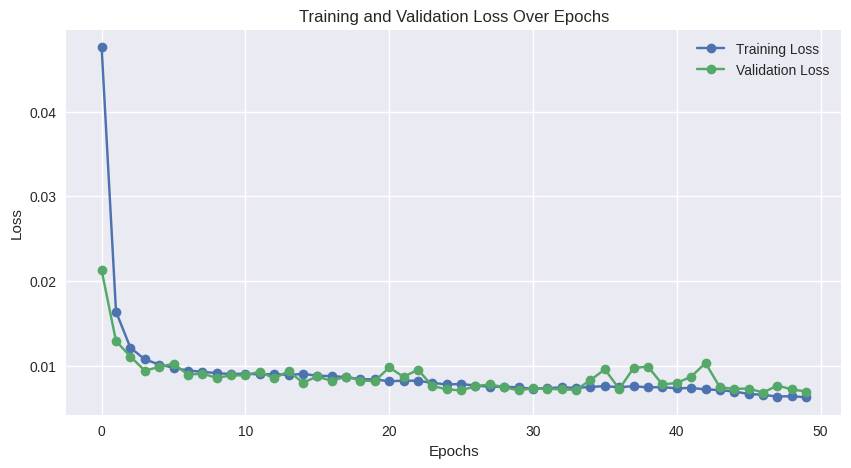

In [12]:
load_path = '/content/drive/MyDrive/result/'
model = ColorizationNet().to(device)
model.load_state_dict(torch.load(load_path + 'model.pth'))
model.eval()

losses = torch.load(load_path + 'losses.pth')
training_losses = losses['training_losses']
validation_losses = losses['validation_losses']

# Plot the training and validation loss
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(training_losses, marker = 'o' , label='Training Loss')
plt.plot(validation_losses, marker = 'o' , label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()


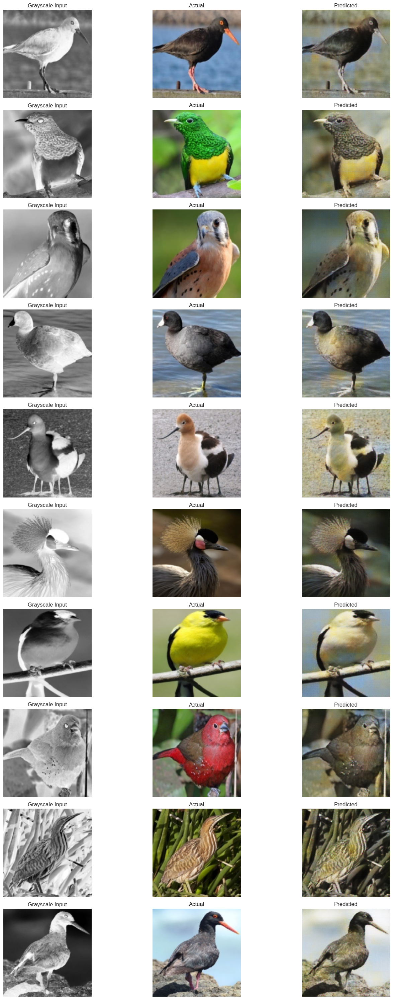

In [13]:
def plot_images(grayscale, actual, predicted, num_images=5):
    """
    Function to plot grayscale, actual, and predicted images.

    Parameters:
    - grayscale: Grayscale images
    - actual: Actual images
    - predicted: Predicted images
    - num_images: Number of images to plot (default is 5)
    """
    plt.figure(figsize=(15, 3*(num_images)))
    for i in range(num_images):
        # Plot grayscale image (1 channel)
        plt.subplot(num_images, 3, 3 * i + 1)
        plt.imshow(grayscale[i][0].cpu().numpy(), cmap='gray')
        plt.title('Grayscale Input')
        plt.axis('off')

        # Plot actual color image (3 channels)
        plt.subplot(num_images, 3, 3 * i + 2)
        plt.imshow(actual[i].permute(1, 2, 0).cpu().numpy())
        plt.title('Actual')
        plt.axis('off')

        # Plot predicted image (3 channels)
        plt.subplot(num_images, 3, 3 * i + 3)
        plt.imshow(predicted[i].permute(1, 2, 0).cpu().numpy())
        plt.title('Predicted')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage with random images
data_iter = iter(test_loader)
grayscale_images, color_images = next(data_iter)  # Get grayscale and color images directly from dataloader

# Predict the output using grayscale images (1 channel)
predicted_images = model(grayscale_images.to(device)).detach().cpu()  # Get predicted images from the model

# Plot the images
plot_images(grayscale_images, color_images, predicted_images, num_images = 10)


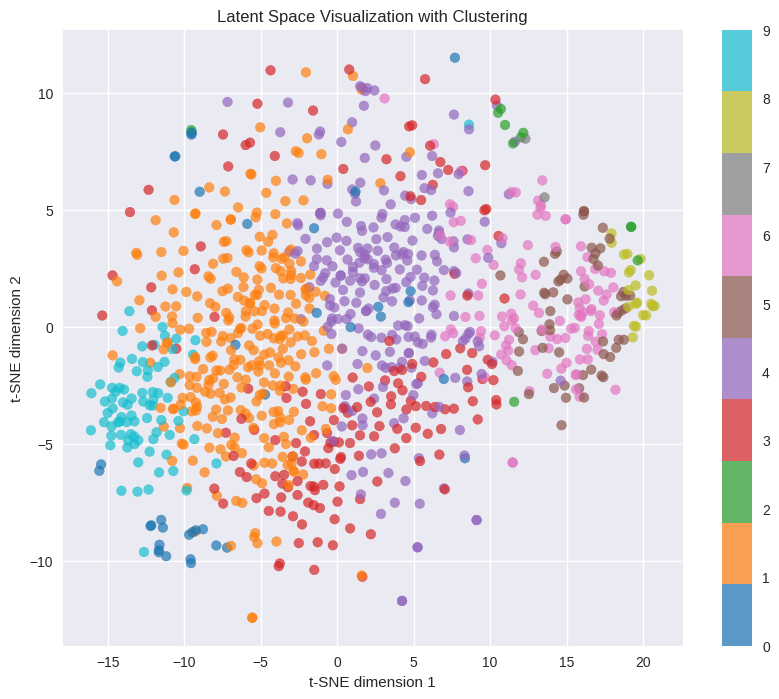

In [14]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import torch
import numpy as np

# Function to visualize the latent space with clustering
def visualize_latent_space_with_clustering(encoder, data_loader, num_samples=1000, num_clusters=10):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images with clustering.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    num_clusters (int): Number of clusters for K-means
    """
    # Set the encoder model to evaluation mode
    encoder.eval()

    all_latent_vectors = []
    all_labels = []

    # Collect the latent representations for a subset of the dataset
    with torch.no_grad():
        for batch_idx, (grayscale_images, labels) in enumerate(data_loader):
            if batch_idx * data_loader.batch_size >= num_samples:
                break

            # Move images to the same device as the model
            grayscale_images = grayscale_images.to(device)

            # Encode the images to get the latent representations
            _, _, _, latent_vectors = encoder(grayscale_images)

            # Flatten the latent vectors to 2D
            latent_vectors = latent_vectors.view(latent_vectors.size(0), -1)

            # Collect the latent vectors and labels
            all_latent_vectors.append(latent_vectors)
            all_labels.append(labels)

    # Concatenate all latent vectors and labels
    all_latent_vectors = torch.cat(all_latent_vectors, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    # Move the latent vectors to the CPU for clustering
    latent_vectors_cpu = all_latent_vectors.cpu().numpy()

    # Cluster the latent vectors using K-means
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(latent_vectors_cpu)

    # Use t-SNE to reduce dimensions of the latent vectors to 2D
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors_cpu)

    # Plot the 2D t-SNE projection with cluster labels
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=cluster_labels, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter, ticks=range(num_clusters))
    plt.title('Latent Space Visualization with Clustering')
    plt.xlabel('t-SNE dimension 1')
    plt.ylabel('t-SNE dimension 2')
    plt.show()

# Use the function to visualize the latent space with clustering
visualize_latent_space_with_clustering(model.encoder, train_loader, num_samples=1000, num_clusters=10)


How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

- **Identifying Clusters:** Yes, distinct clusters can be identified in the latent space. These clusters are represented by different colors, indicating that the VAE has learned to group similar features or categories together.
- **Informing VAE's Ability:** The presence of well-defined clusters suggests that the VAE can differentiate between various input characteristics related to color information. Each cluster likely corresponds to specific features or categories of the grayscale images that have been generalized into colored outputs. This demonstrates the VAE's ability to capture complex patterns and relationships between grayscale and color features, enhancing its generalization capabilities.


2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

- **Neighboring Points Analysis:** Neighboring points in the latent space are likely to result in similar color outputs, indicating a smooth latent representation. This continuity suggests that small changes in the latent space lead to gradual changes in the generated images. This smoothness is crucial for the VAE to produce realistic and coherent outputs.
- **Impact on Quality and Realism:** Smooth transitions in the latent space can enhance the quality and realism of the generated colorations, especially for input images with gradual changes in lighting or shading. This ensures that the VAE can produce realistic color variations without abrupt changes, making the generated images more visually appealing and believable.


3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?


- **Assessing t-SNE:** t-SNE is effective in projecting high-dimensional latent vectors into a comprehensible 2D representation, allowing for the visualization of clusters and relationships between points. However, t-SNE can sometimes distort distances and densities, which might affect the interpretation of the exact relationships between points.
- **Limitations:** The main limitation of t-SNE is that it may not preserve the global structure of the data perfectly. This can lead to misinterpretations of the distances and relationships between clusters. Despite this, t-SNE provides valuable insights into the local structure and clustering of the latent space. While it's a powerful tool for visualizing complex data, it's important to be aware of its limitations and interpret the results accordingly.

*Elaborate* on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

:<b>The encoder-decoder architecture in image colorization effectively captures complex data distributions by compressing grayscale images into a latent space and reconstructing them with added color details. Unlike a simple autoencoder, it has a deeper structure and uses sophisticated loss functions to produce more realistic and accurate color outputs. This architecture excels in learning intricate patterns and relationships between grayscale and color features.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

:<b> Perceptual loss enhances the quality of colorized images by comparing high-level features extracted from a pre-trained network (e.g., VGG) rather than comparing individual pixels. Unlike Mean Squared Error (MSE), which measures similarity at the pixel level and can lead to blurry results, perceptual loss evaluates the similarity of images based on their feature representations, capturing more contextual and perceptual information. This results in sharper, more realistic colorizations that align better with human visual perception.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

:<b>The latent space in a VAE significantly impacts the fidelity and diversity of generated color images by encoding essential features and patterns. A well-structured latent space ensures high-quality, realistic outputs with diverse variations. Varying the dimensionality of the latent space affects this balance; higher dimensions can capture more detailed and complex features, enhancing fidelity and diversity, while lower dimensions might simplify the space, potentially reducing image quality but improving model training efficiency.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

In [15]:
import zipfile

# Path to the zip file
zip_path = '/content/drive/MyDrive/drive-download-20241218T230946Z-002.zip'

# Path to the directory where the contents will be extracted
extract_path = '/content/drive/MyDrive/part2'

# Ensure the extraction path exists
if not os.path.exists(extract_path):
    os.makedirs(extract_path)

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Unzipping complete!")


Unzipping complete!


## Importing necessary libraries

In [16]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

Error loading image: /content/drive/MyDrive/part2/Image/0.jpg
Image size too small: /content/drive/MyDrive/part2/Image/1022.jpg
Image size too small: /content/drive/MyDrive/part2/Image/1042.jpg
Image size too small: /content/drive/MyDrive/part2/Image/1047.jpg
Image size too small: /content/drive/MyDrive/part2/Image/1048.jpg
Image size too small: /content/drive/MyDrive/part2/Image/2006.jpg
Image size too small: /content/drive/MyDrive/part2/Image/2040.jpg
Image size too small: /content/drive/MyDrive/part2/Image/2043.jpg
Image size too small: /content/drive/MyDrive/part2/Image/2044.jpg
Image size too small: /content/drive/MyDrive/part2/Image/3080.jpg
Image size too small: /content/drive/MyDrive/part2/Image/3097.jpg


<ipython-input-17-820b841a0eee>:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


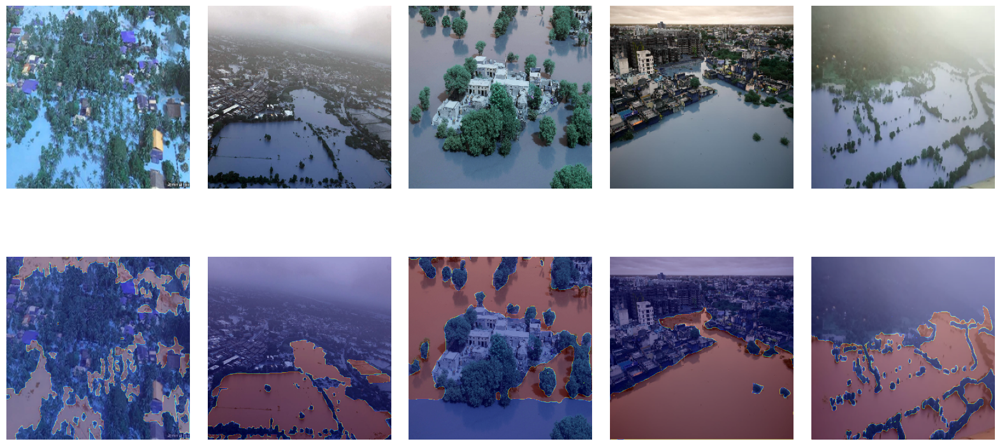

In [17]:
def create_data(data_dir):
    """
    Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_paths = sorted(glob.glob(os.path.join(data_dir, 'Image', '*.jpg')))
    mask_paths = sorted(glob.glob(os.path.join(data_dir, 'Mask', '*.png')))

    return image_paths, mask_paths

def load_image(image_path, SIZE, mask=False):
    """
    Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    image = cv2.imread(image_path, cv2.IMREAD_COLOR if not mask else cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Error loading image: {image_path}")
        return None
    if image.shape[0] < SIZE or image.shape[1] < SIZE:
        print(f"Image size too small: {image_path}")
        return None
    image = cv2.resize(image, (SIZE, SIZE))
    image = np.array(image, dtype=np.float32) / 255.0
    if mask:
        image = np.expand_dims(image, axis=-1)  # Expand dimensions for masks
    return image

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    if trim:
        image_paths = image_paths[:trim]
    images = []
    valid_paths = []
    for img_path in image_paths:
        img = load_image(img_path, SIZE, mask)
        if img is not None:
            images.append(img)
            valid_paths.append(img_path)
    return np.array(images), valid_paths

def show_image(image, title=None, cmap=None, alpha=1):
    """
    Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, msks):
    """
    Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    n = len(imgs)
    cols = 5
    rows = n // cols + int(n % cols != 0)
    fig, axes = plt.subplots(2 * rows, cols, figsize=(20, 10 * rows), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})

    for i in range(n):
        row = i // cols
        col = i % cols

        ax_image = axes[2 * row, col]
        ax_mask = axes[2 * row + 1, col]

        ax_image.imshow(imgs[i])
        ax_image.axis('off')

        ax_mask.imshow(imgs[i])
        ax_mask.imshow(msks[i], cmap='jet', alpha=0.4)
        ax_mask.axis('off')

    for i in range(n, 2 * rows * cols):
        fig.delaxes(axes.flat[i])

    plt.tight_layout()
    plt.show()


SIZE = 256

# Load and visualize images
extract_path = '/content/drive/MyDrive/part2'
image_paths, mask_paths = create_data(extract_path)
images, valid_image_paths = load_images(image_paths, SIZE)
masks, _ = load_images([path.replace('Image', 'Mask').replace('.jpg', '.png') for path in valid_image_paths], SIZE, mask=True)

# Display a few examples
show_images(images[:10], masks[:10])


## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [99]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = pred.contiguous()
        target = target.contiguous()
        intersection = (pred * target).sum(dim=2).sum(dim=2)
        dice = (2. * intersection + self.smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + self.smooth)
        return 1 - dice.mean()

class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = pred.contiguous()
        target = target.contiguous()
        intersection = (pred * target).sum(dim=2).sum(dim=2)
        union = pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) - intersection
        jaccard = (intersection + self.smooth) / (union + self.smooth)
        return 1 - jaccard.mean()

class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate, pooling=True):
        super(EncoderBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.dropout = nn.Dropout(rate)
        self.pooling = pooling
        if self.pooling:
            self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.dropout(x)
        if self.pooling:
            x = self.pool(x)
        return x

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate):
        super(DecoderBlock, self).__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.encoder = EncoderBlock(out_channels, out_channels, rate, pooling=False)

    def forward(self, x, skip_connection):
        x = self.upconv(x)
        x = torch.cat((x, skip_connection), dim=1)
        x = self.encoder(x)
        return x

class AttentionGate(nn.Module):
    def __init__(self, in_channels, out_channels, bn):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(out_channels) if bn else nn.Identity()
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(out_channels) if bn else nn.Identity()
        )
        self.psi = nn.Sequential(
            nn.Conv2d(out_channels, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1) if bn else nn.Identity(),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        self.encoder1 = EncoderBlock(3, 64, 0.1)
        self.encoder2 = EncoderBlock(64, 128, 0.1)
        self.encoder3 = EncoderBlock(128, 256, 0.2)
        self.encoder4 = EncoderBlock(256, 512, 0.2, pooling=False)

        self.attention1 = AttentionGate(512, 256, bn=True)
        self.attention2 = AttentionGate(256, 128, bn=True)
        self.attention3 = AttentionGate(128, 64, bn=True)

        self.decoder1 = DecoderBlock(512, 256, 0.2)
        self.decoder2 = DecoderBlock(256, 128, 0.2)
        self.decoder3 = DecoderBlock(128, 64, 0.1)
        self.decoder4 = DecoderBlock(64, 64, 0.1)

        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        d1 = self.decoder1(e4, self.attention1(e4, e3))
        d2 = self.decoder2(d1, self.attention2(d1, e2))
        d3 = self.decoder3(d2, self.attention3(d2, e1))
        d4 = self.decoder4(d3, e1)

        output = self.output_layer(d4)
        return torch.sigmoid(output)

    def compute_loss(self, pred, target):
        dice_loss = DiceLoss()
        jaccard_loss = JaccardLoss()
        return dice_loss(pred, target) + jaccard_loss(pred, target)

# Model instantiation
model = UNetModel()


## Training

In [ ]:
# TODO: Plot training and validation losses and accuracies

## Plottings

In [ ]:
# Plot the original mask, the one you predicted, and the final one using a threshold

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

Explain the difference between the predicted and processed mask above.